In [1]:
import gymnasium as gym
from gymnasium import Env
import random
import numpy as np
import os
import matplotlib.pyplot as plt
import minigrid

pygame 2.6.0 (SDL 2.28.4, Python 3.12.3)
Hello from the pygame community. https://www.pygame.org/contribute.html


In [4]:
class numberMatcher(Env):
    def __init__(self):
        self.grid = np.zeros((5, 5))
        self.stateSpace = [i for i in range(25)]
        for i in [0, 4, 20, 24]:
            self.stateSpace.remove(i)
        self.stateSpacePlus = [i for i in range(25)]
        self.actionSpace = {"U": -5, "D": 5, "L": -1, "R": 1}
        self.possibleActions = ["U", "D", "L", "R"]
        self.agentPosition = 12
        self.cornerValues = [1, 2, 3, 4]
        self.cornerPositions = [0, 4, 20, 24]
        for idx, pos in enumerate(self.cornerPositions):
            x, y = divmod(pos, 5)
            self.grid[x][y] = self.cornerValues[idx]
        self.setState()
    def endState(self, state):
        return state in self.stateSpacePlus and state not in self.stateSpace
    def getAgentPosition(self):
        x = self.agentPosition // 5
        y = self.agentPosition % 5
        return x, y
    def setState(self, newState=12):
        self.agentPosition = newState
        x, y = self.getAgentPosition()
        self.grid[x][y] = random.choice(self.cornerValues)
    def offGrid(self, newState, oldState):
        if newState not in self.stateSpacePlus:
            return True
        elif oldState % 5 == 0 and newState % 5 == 4:
            return True
        elif oldState % 5 == 4 and newState % 5 == 0:
            return True
        else:
            return False
    def terminateState(self, state):
        x, y = divmod(state, 5)
        agent_value = self.grid[self.agentPosition // 5][self.agentPosition % 5]
        corner_value = self.grid[x][y]
        if agent_value == corner_value:
            reward = 10
            print("You won!")
            return True, reward
        else:
            reward = - 10
            print("You lost!")
            return True, reward 
    def step(self, action):
        if action not in self.actionSpace:
            raise ValueError(f"Invalid action: {action}")
        outputState = self.agentPosition + self.actionSpace[action]
        if not self.endState(outputState):
            reward = -0.5
        else:
            terminate, reward = self.terminateState(outputState)
            if terminate:
                return outputState, reward, terminate, None
            else:
                reward = -0.5  
        if not self.offGrid(outputState, self.agentPosition):
            self.agentPosition = outputState
            self.setState(self.agentPosition)
            return outputState, reward, self.endState(self.agentPosition), None
        else:
            return self.agentPosition, reward, self.endState(self.agentPosition), None
    def reset(self):
        self.agentPosition = 12
        self.grid = np.zeros((5, 5))
        for idx, pos in enumerate(self.cornerPositions):
            x, y = divmod(pos, 5)
            self.grid[x][y] = self.cornerValues[idx]
        self.setState()
        return self.agentPosition
    def render(self):
        for row in self.grid:
            for col in row:
                if col == 0:
                    print("-", end="\t")
                else:
                    print(int(col), end="\t")
            print("\n")
    def actionSpaceSample(self):
        return np.random.choice(self.possibleActions)
def maxAction(Q, state, actions):
    values = np.array([Q.get((state, a), 0) for a in actions])
    action = actions[np.argmax(values)]
    return action

1	-	-	-	2	

-	-	-	-	-	

-	-	3	-	-	

-	-	-	-	-	

3	-	-	-	4	

starting game 0
Agent Position: 12
Epsilon: 1.0
Reward: 0
Q-value for state 12 and action U: 0
Q-value for state 12 and action D: 0
Q-value for state 12 and action L: 0
Q-value for state 12 and action R: 0
Selected Action: R
Agent Position: 13
Epsilon: 1.0
Reward: -0.5
Q-value for state 13 and action U: 0
Q-value for state 13 and action D: 0
Q-value for state 13 and action L: 0
Q-value for state 13 and action R: 0
Selected Action: U
Agent Position: 8
Epsilon: 1.0
Reward: -1.0
Q-value for state 8 and action U: 0
Q-value for state 8 and action D: 0
Q-value for state 8 and action L: 0
Q-value for state 8 and action R: 0
Selected Action: R
Agent Position: 9
Epsilon: 1.0
Reward: -1.5
Q-value for state 9 and action U: 0
Q-value for state 9 and action D: 0
Q-value for state 9 and action L: 0
Q-value for state 9 and action R: 0
Selected Action: D
Agent Position: 14
Epsilon: 1.0
Reward: -2.0
Q-value for state 14 and action U: 0
Q-value

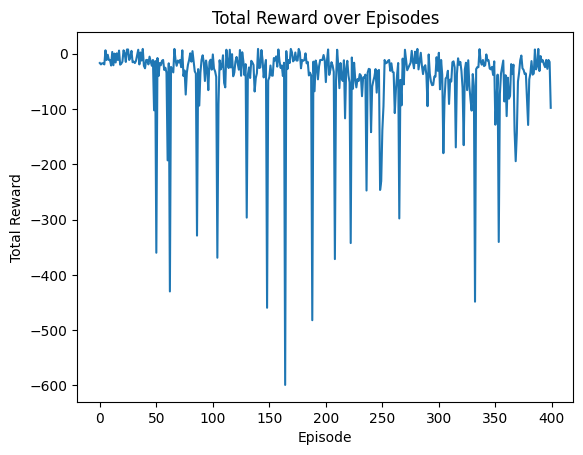

In [8]:
if __name__ == "__main__":
    env = numberMatcher()
    alpha = 0.01
    gamma = 0.9
    epsilon = 1.0
    Q = {}
    for state in env.stateSpacePlus:
        for action in env.possibleActions:
            Q[(state, action)] = 0
    numGames = 400
    totalRewards = np.zeros(numGames)
    env.render()
    for i in range(numGames):
        print("starting game", i)
        done = False
        epRewards = 0
        observation = env.reset()
        while not done:
            print(f"Agent Position: {env.agentPosition}")
            print(f"Epsilon: {epsilon}")
            print(f"Reward: {epRewards}")
            for action in env.possibleActions:
                print(f"Q-value for state {observation} and action {action}: {Q[(observation, action)]}")
            rand = np.random.random()
            if rand < epsilon:
                action = env.actionSpaceSample()
            else:
                action = maxAction(Q, observation, env.possibleActions)
            print(f"Selected Action: {action}")
            observation_, reward, done, info = env.step(action)
            epRewards += reward
            action_ = maxAction(Q, observation_, env.possibleActions)
            Q[(observation, action)] = Q.get((observation, action), 0) + alpha*(reward + gamma * Q.get((observation_, action_), 0) - Q.get((observation, action), 0))
            observation = observation_
        epsilon = max(epsilon - 10 / numGames, 0)
        totalRewards[i] = epRewards
    plt.plot(totalRewards)
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.title('Total Reward over Episodes')
    plt.show()